#### Importing Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
import csv
from collections import Counter
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import OneHotEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go

#### Dataset

In [ ]:
df = pd.read_csv("/content/Jan-24 project.csv")
df

,product_id,product_title,category,product_subcategory,brand,selling_price,original_price,product_type,product_rating,product_description,availability_status,customer_reviews_count,seasonal_indicator,promotion_indicator,shipping_weight,bundle_indicator,customer_demographics
0,1,Garlic Oil - Vegetarian Capsule 500 mg,Beauty & Hygiene,Hair Care,Sri Sri Ayurveda,220.00,220.0,Hair Oil & Serum,4.1,This Product contains Garlic Oil that is known...,In Stock,7,Spring,Yes,0.658145,Individual,Female
1,2,Water Bottle - Orange,"Kitchen, Garden & Pets",Storage & Accessories,Mastercook,180.00,180.0,Water & Fridge Bottles,2.3,"Each product is microwave safe (without lid), ...",In Stock,54,Winter,No,4.734585,Bundle,Female
2,3,"Brass Angle Deep - Plain, No.2",Cleaning & Household,Pooja Needs,Trm,119.00,250.0,Lamp & Lamp Oil,3.4,"A perfect gift for all occasions, be it your m...",In Stock,31,Winter,No,2.024140,Bundle,Female
3,4,Cereal Flip Lid Container/Storage Jar - Assort...,Cleaning & Household,Bins & Bathroom Ware,Nakoda,149.00,176.0,"Laundry, Storage Baskets",3.7,Multipurpose container with an attractive desi...,In Stock,49,Spring,No,3.869239,Individual,Other
4,5,Creme Soft Soap - For Hands & Body,Beauty & Hygiene,Bath & Hand Wash,Nivea,162.00,162.0,Bathing Bars & Soaps,4.4,Nivea Creme Soft Soap gives your skin the best...,In Stock,74,Winter,Yes,0.812489,Individual,Male
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27550,27551,"Wottagirl! Perfume Spray - Heaven, Classic",Beauty & Hygiene,Fragrances & Deos,Layerr,199.20,249.0,Perfume,3.9,Layerr brings you Wottagirl Classic fragrant b...,In Stock,75,Autumn,Yes,1.992988,Bundle,Other
27551,27552,Rosemary,Gourmet & World Food,Cooking & Baking Needs,Puramate,67.50,75.0,"Herbs, Seasonings & Rubs",4.0,Puramate rosemary is enough to transform a dis...,In Stock,65,Autumn,No,2.893314,Bundle,Female
27552,27553,Peri-Peri Sweet Potato Chips,Gourmet & World Food,"Snacks, Dry Fruits, Nuts",FabBox,200.00,200.0,Nachos & Chips,3.8,We have taken the richness of Sweet Potatoes (...,In Stock,61,Autumn,Yes,3.644294,Individual,Female
27553,27554,Green Tea - Pure Original,Beverages,Tea,Tetley,396.00,495.0,Tea Bags,4.2,"Tetley Green Tea with its refreshing pure, ori...",In Stock,7,Summer,No,4.540101,Individual,Other


In [ ]:
df.isnull().sum()

product_id                   0
product_title                1
category                     0
product_subcategory          0
brand                        1
selling_price                0
original_price               0
product_type                 0
product_rating            8626
product_description        115
availability_status          0
customer_reviews_count       0
seasonal_indicator           0
promotion_indicator          0
shipping_weight              0
bundle_indicator             0
customer_demographics        0
dtype: int64

<Axes: >

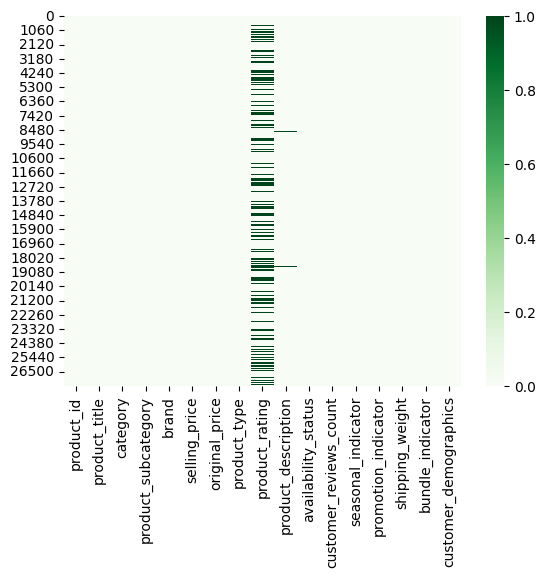

In [ ]:
sns.heatmap(df.isnull(),cmap='Greens')

##### Handling missing values

In [ ]:
#Apply linear interpolation to the 'product_rating' column
df['product_rating'] = df['product_rating'].interpolate(method='linear')

#Replace missing values in the 'product_description' column with 'Not available'
df['product_description'].fillna('Not available', inplace=True)
df = df.dropna()
df.isnull().sum()

product_id                0
product_title             0
category                  0
product_subcategory       0
brand                     0
selling_price             0
original_price            0
product_type              0
product_rating            0
product_description       0
availability_status       0
customer_reviews_count    0
seasonal_indicator        0
promotion_indicator       0
shipping_weight           0
bundle_indicator          0
customer_demographics     0
dtype: int64

In [ ]:
df.shape

(27553, 17)

In [ ]:
df.columns

Index(['product_id', 'product_title', 'category', 'product_subcategory',
       'brand', 'selling_price', 'original_price', 'product_type',
       'product_rating', 'product_description', 'availability_status',
       'customer_reviews_count', 'seasonal_indicator', 'promotion_indicator',
       'shipping_weight', 'bundle_indicator', 'customer_demographics'],
      dtype='object')

#### Some EDA

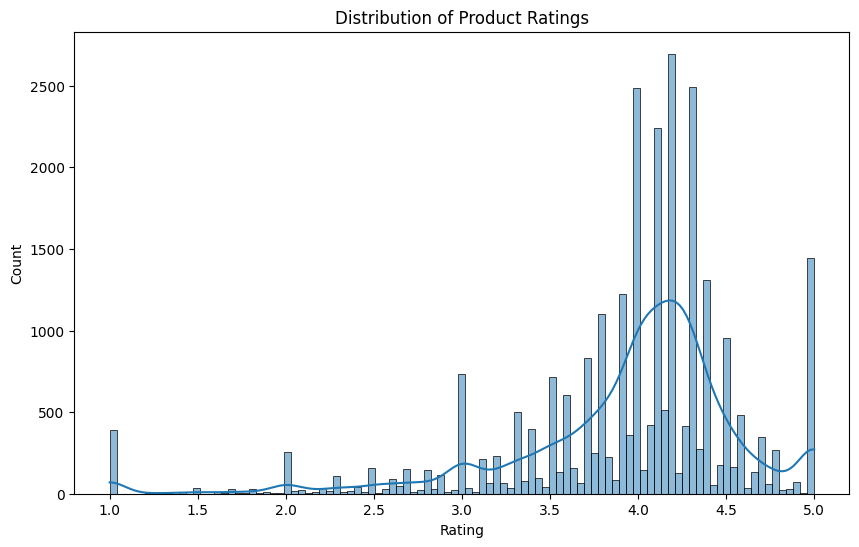

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(df['product_rating'], kde=True)
plt.title('Distribution of Product Ratings')
plt.xlabel('Rating')
plt.ylabel('Count')
plt.show()


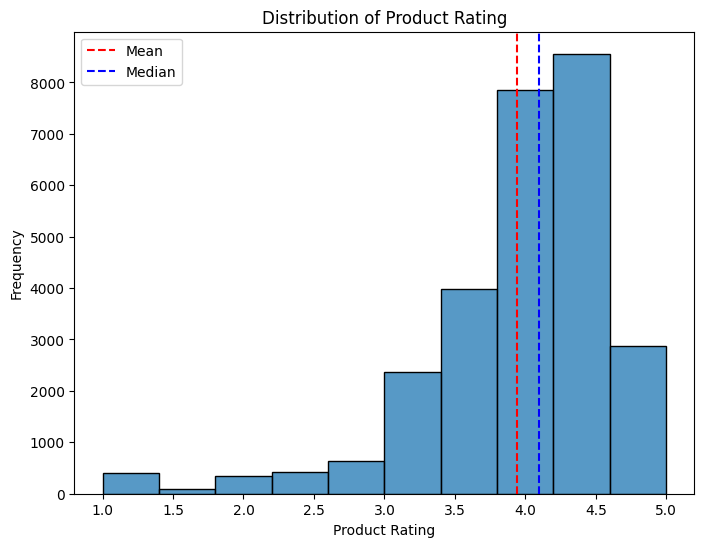

In [ ]:
# prompt: plot the distribution of ratings and highlight the mean and median

import matplotlib.pyplot as plt
import seaborn as sns

# Create a figure and axes
fig, ax = plt.subplots(figsize=(8, 6))

# Plot the distribution of ratings
sns.histplot(data=df, x="product_rating", bins=10)

# Calculate the mean and median
mean_rating = df["product_rating"].mean()
median_rating = df["product_rating"].median()

# Add vertical lines for mean and median
ax.axvline(mean_rating, color="red", linestyle="--", label="Mean")
ax.axvline(median_rating, color="blue", linestyle="--", label="Median")

# Add legend and labels
ax.legend()
ax.set_xlabel("Product Rating")
ax.set_ylabel("Frequency")
plt.title('Distribution of Product Rating')

# Show the plot
plt.show()


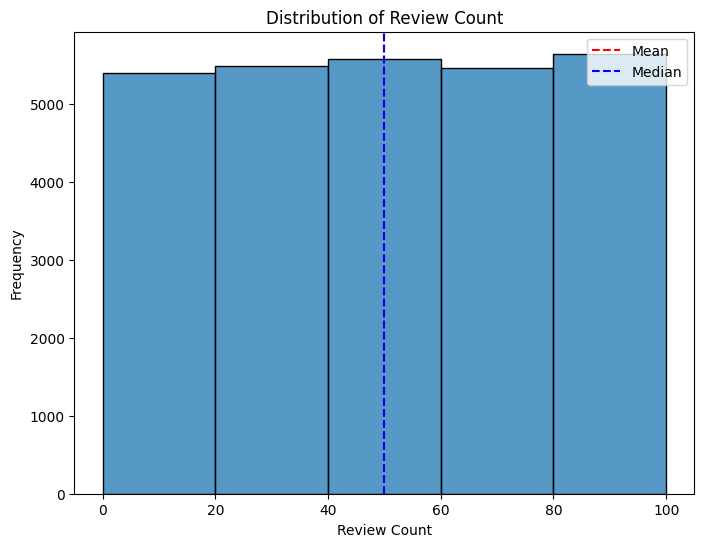

In [ ]:
# prompt: plot the distribution of ratings and highlight the mean and median

import matplotlib.pyplot as plt
import seaborn as sns

# Create a figure and axes
fig, ax = plt.subplots(figsize=(8, 6))

# Plot the distribution of ratings
sns.histplot(data=df, x="customer_reviews_count", bins=5)

# Calculate the mean and median
mean_rating = df["customer_reviews_count"].mean()
median_rating = df["customer_reviews_count"].median()

# Add vertical lines for mean and median
ax.axvline(mean_rating, color="red", linestyle="--", label="Mean")
ax.axvline(median_rating, color="blue", linestyle="--", label="Median")

# Add legend and labels
ax.legend()
ax.set_xlabel("Review Count")
ax.set_ylabel("Frequency")
plt.title('Distribution of Review Count')

# Show the plot
plt.show()


<Axes: >

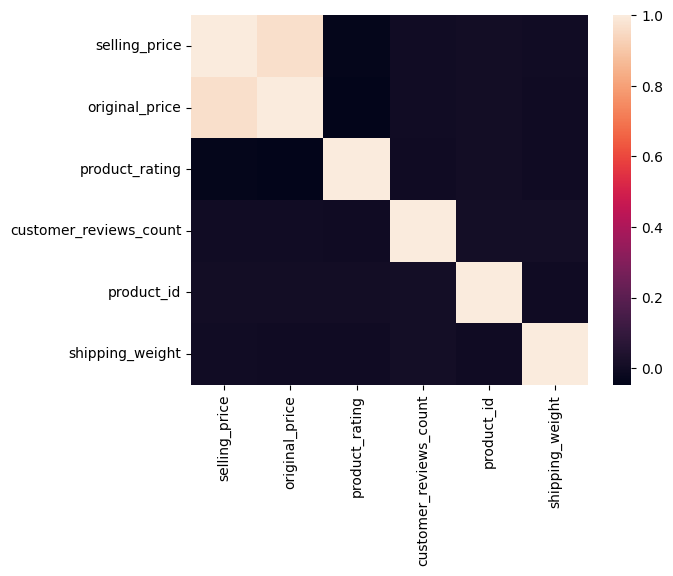

In [ ]:
sns.heatmap(df[['selling_price','original_price','product_rating','customer_reviews_count','product_id','shipping_weight']].corr())

No correlation

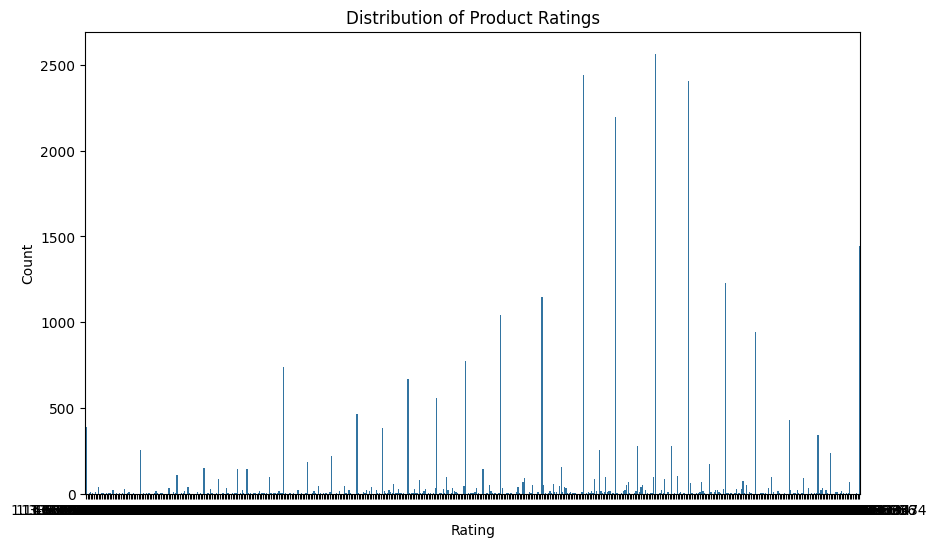

In [ ]:
# Distribution of product ratings
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='product_rating')
plt.title('Distribution of Product Ratings')
plt.xlabel('Rating')
plt.ylabel('Count')
plt.show()


#### ANALYSIS

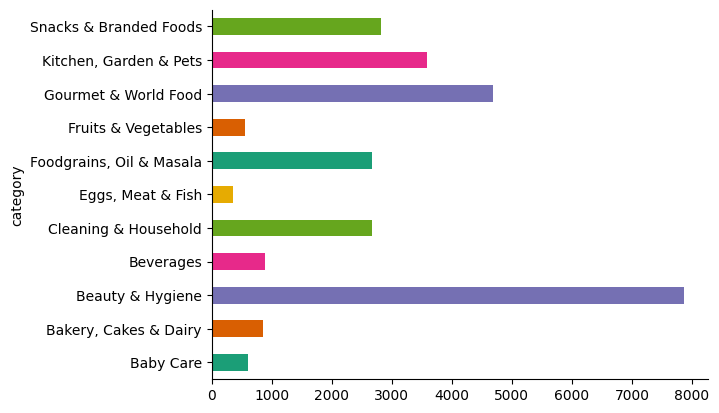

In [ ]:
# @title product_subcategory

from matplotlib import pyplot as plt
import seaborn as sns
df.groupby('category').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

In [ ]:
# Analyze Sales
df['total_sales'] = df['customer_reviews_count']
sales_metrics = df.groupby('product_title')['total_sales'].sum().reset_index()

# Analyze Ratings
rating_metrics = df.groupby('product_title')['product_rating'].mean().reset_index()

# Analyze Pricing
df['discount'] = (df['original_price'] - df['selling_price']) / df['original_price']
pricing_metrics = df.groupby('product_title')['discount'].mean().reset_index()

# Combine metrics
product_metrics = pd.merge(sales_metrics, rating_metrics, on='product_title')
product_metrics = pd.merge(product_metrics, pricing_metrics, on='product_title')

# Print or further analyze the product metrics
product_metrics.head()

,product_title,total_sales,product_rating,discount
0,& Moms - Citrus Soap,0,4.2,0.00
1,& Moms - Sandal Soap,1,4.2,0.10
2,& Moms Bathing Soap - Jasmine,32,4.6,0.10
3,& Moms Bathing Soap - Tulsi,16,4.4,0.10
4,0.0 Non Alcoholic Beer,35,4.2,0.25


In [ ]:
# Group by product type and calculate average sales, ratings, and pricing
product_type_metrics = df.groupby('product_type').agg({
    'total_sales': 'sum',
    'product_rating': 'mean',
    'discount': 'mean'
}).reset_index()

print("Product Type Metrics:")
product_type_metrics

Product Type Metrics:


,product_type,total_sales,product_rating,discount
0,Adult Diapers,2076,3.944167,0.067122
1,"Aerated, Still, Sparkling",1778,3.870960,0.000000
2,"Agarbatti, Incense Sticks",4650,3.995833,0.022955
3,Air Freshener,7849,3.967116,0.060882
4,Almonds,616,4.052564,0.223513
...,...,...,...,...
421,"Wet Wipe, Pocket Tissues",352,4.268519,0.099507
422,Whole Spices,6032,4.036450,0.162975
423,Wine & Rice Vinegar,217,3.800000,0.000000
424,Women's Deodorants,7083,3.976288,0.215926


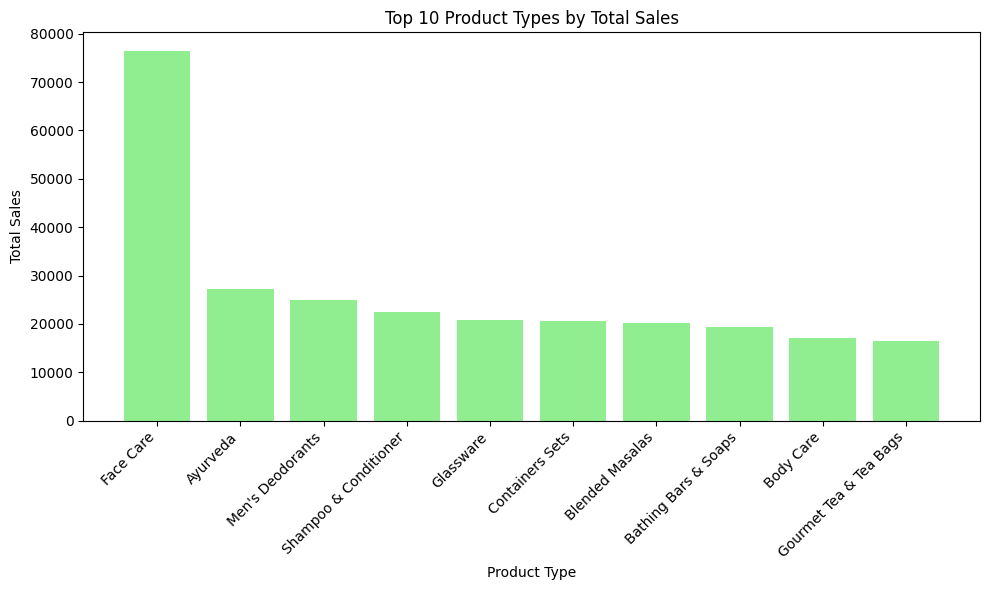

In [ ]:
# Extract top 10 product types with total sales
top_10_products = product_type_metrics.nlargest(10, 'total_sales')

# Plot bar chart
plt.figure(figsize=(10, 6))
plt.bar(top_10_products['product_type'], top_10_products['total_sales'], color='lightgreen')
plt.title('Top 10 Product Types by Total Sales')
plt.xlabel('Product Type')
plt.ylabel('Total Sales')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


##### Brand

In [ ]:
# Group by brand and calculate average sales and discount
brand_metrics = df.groupby('brand').agg({
    'total_sales': 'sum',
    'discount': 'mean'
}).reset_index()

print("Sales and Discount Analysis by Brand:")
brand_metrics

Sales and Discount Analysis by Brand:


,brand,total_sales,discount
0,&Me,62,0.000000
1,&Stirred,691,0.000000
2,109°F,100,0.502513
3,137 Degree,27,0.000000
4,18 Herbs,1579,0.000000
...,...,...,...
2308,mJOY,113,0.300000
2309,marshmallow,69,0.000000
2310,moha,202,0.200000
2311,mother dairy,596,0.059324


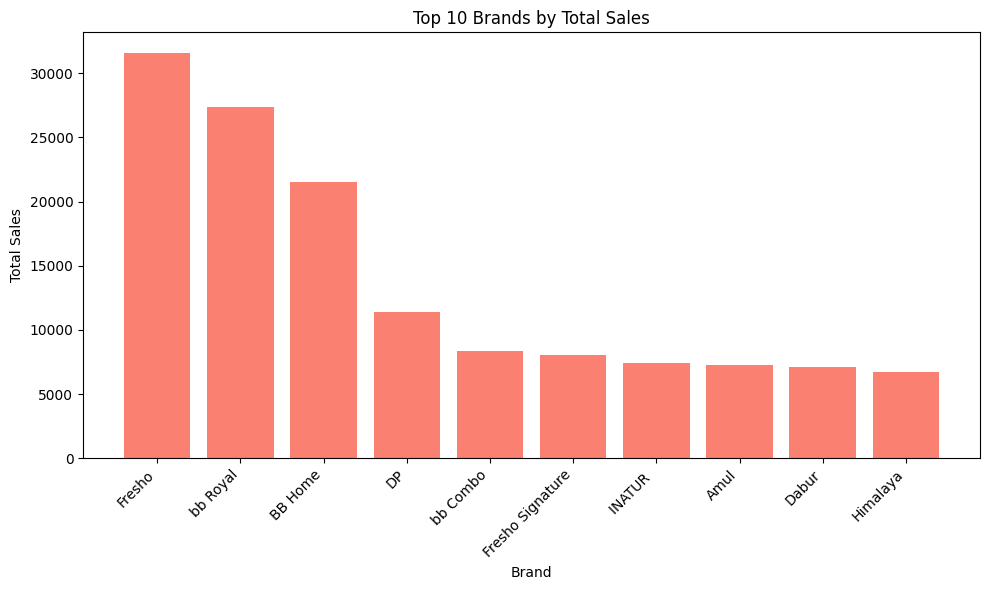

In [ ]:
# Extract top 10 brands by total sales
top_10_brands = brand_metrics.nlargest(10, 'total_sales')

# Plot bar chart
plt.figure(figsize=(10, 6))
plt.bar(top_10_brands['brand'], top_10_brands['total_sales'], color='salmon')
plt.title('Top 10 Brands by Total Sales')
plt.xlabel('Brand')
plt.ylabel('Total Sales')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [ ]:
sales_analysis = df.groupby('product_type')['total_sales'].sum()

print("Sales Analysis by Product Type:")
print(sales_analysis)

Sales Analysis by Product Type:
product_type
Adult Diapers                2076
Aerated, Still, Sparkling    1778
Agarbatti, Incense Sticks    4650
Air Freshener                7849
Almonds                       616
                             ... 
Wet Wipe, Pocket Tissues      352
Whole Spices                 6032
Wine & Rice Vinegar           217
Women's Deodorants           7083
Yogurt & Shrikhand            830
Name: total_sales, Length: 426, dtype: int64


product_type
Face Care                   76464
Ayurveda                    27149
Men's Deodorants            24995
Shampoo & Conditioner       22536
Glassware                   20813
Containers Sets             20527
Blended Masalas             20238
Bathing Bars & Soaps        19354
Body Care                   17142
Gourmet Tea & Tea Bags      16383
Namkeen & Savoury Snacks    14496
Water & Fridge Bottles      14435
Aromatherapy                13751
Hand Wash & Sanitizers      12049
Supplements & Proteins      11950
Dry Fruits & Berries        11406
Powdered Spices             11393
Lunch Boxes                 10960
Diapers                     10886
Pet Meals & Treats          10836
Name: total_sales, dtype: int64


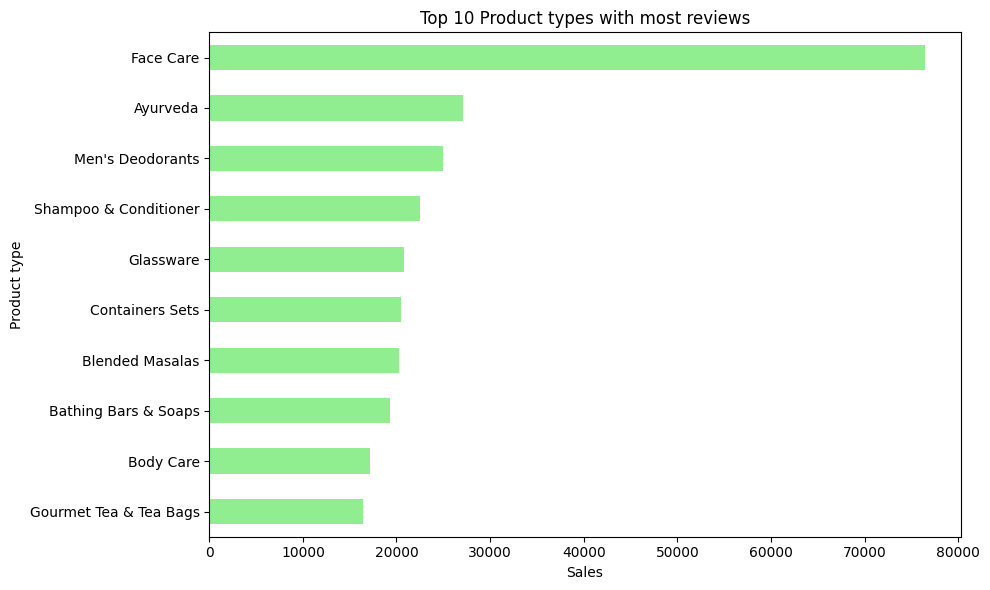

In [ ]:
print(sales_analysis.nlargest(20))
#sales_analysis.nlargest(20)
plt.figure(figsize=(10, 6))
sales_analysis.nlargest(10).plot(kind='barh', color='lightgreen')
plt.xlabel('Sales')
plt.ylabel('Product type')
plt.title('Top 10 Product types with most reviews')
plt.gca().invert_yaxis()  # Invert y-axis to show highest score at the top
plt.tight_layout()
plt.show()

### Customer Satisfaction and Preference

Top 10 brands with good customer satisfaction based on product rating and customer review count:
brand
Fresho              0.745029
bb Royal            0.647350
BB Home             0.513308
DP                  0.274388
bb Combo            0.192273
Fresho Signature    0.190470
Amul                0.175129
Dabur               0.170720
INATUR              0.169097
Himalaya            0.167104
dtype: float64


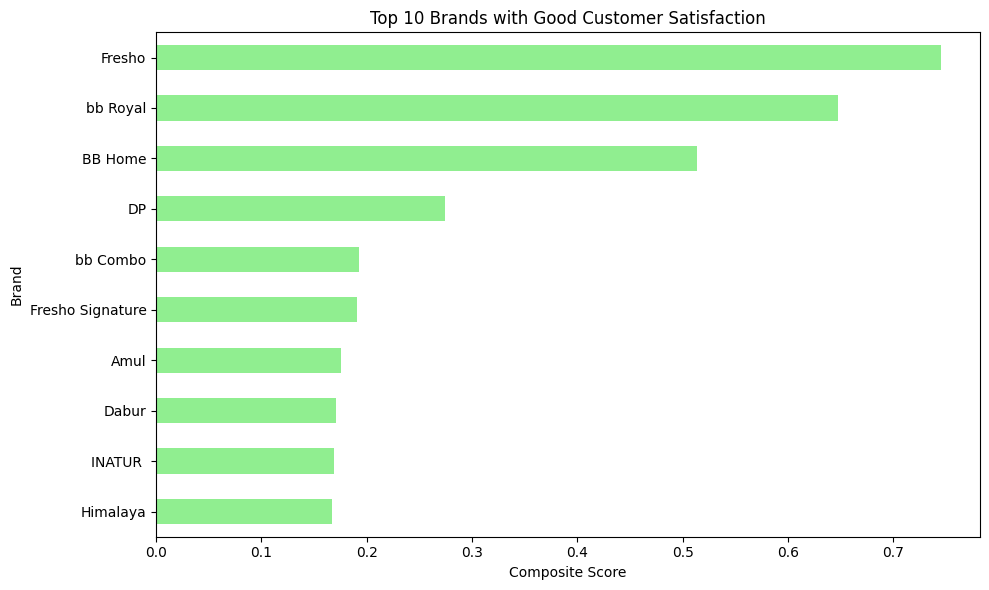

In [ ]:
average_rating_by_brand2 = df.groupby('brand')['product_rating'].mean()

# Calculate the total customer review count for each brand
total_review_count_by_brand2 = df.groupby('brand')['customer_reviews_count'].sum()

# Normalize the scores
normalized_rating2 = (average_rating_by_brand2 - average_rating_by_brand2.min()) / (average_rating_by_brand2.max() - average_rating_by_brand2.min())
normalized_review_count2 = (total_review_count_by_brand2 - total_review_count_by_brand2.min()) / (total_review_count_by_brand2.max() - total_review_count_by_brand2.min())

# Combine the normalized scores to calculate the composite score
composite_score2 = normalized_rating2 * normalized_review_count2

# Select the top 10 brands with the highest composite scores
top_10_brands2 = composite_score2.nlargest(10)

print("Top 10 brands with good customer satisfaction based on product rating and customer review count:")
print(top_10_brands2)

plt.figure(figsize=(10, 6))
top_10_brands2.plot(kind='barh', color='lightgreen')
plt.xlabel('Composite Score')
plt.ylabel('Brand')
plt.title('Top 10 Brands with Good Customer Satisfaction')
plt.gca().invert_yaxis()  # Invert y-axis to show highest score at the top
plt.tight_layout()
plt.show()


## WORDCLOUDS

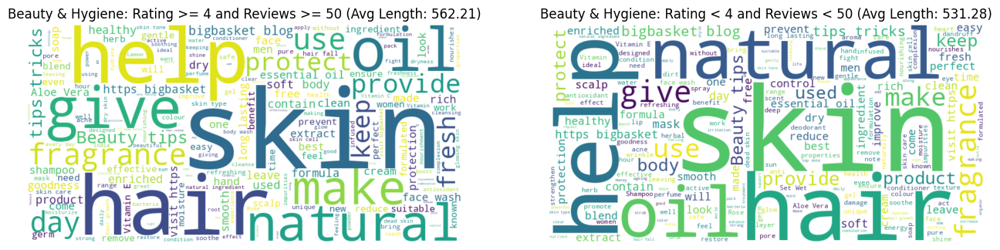

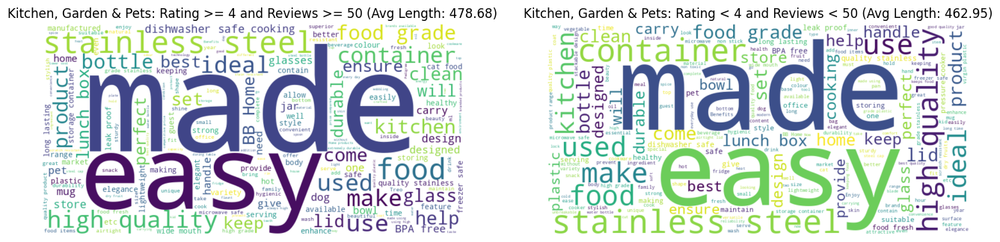

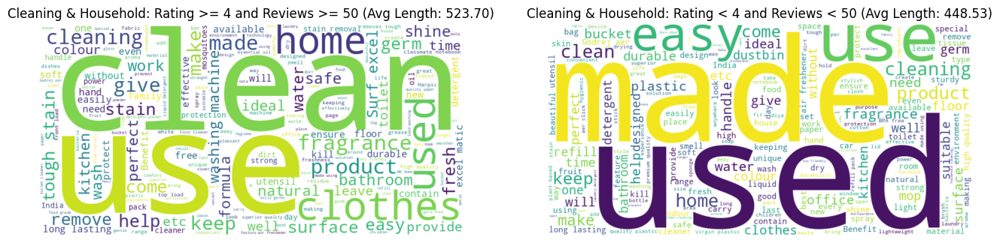

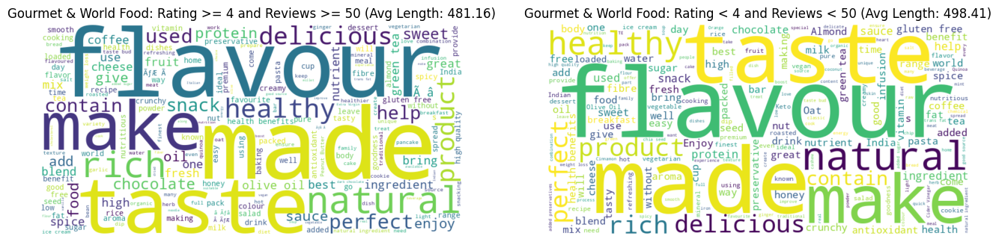

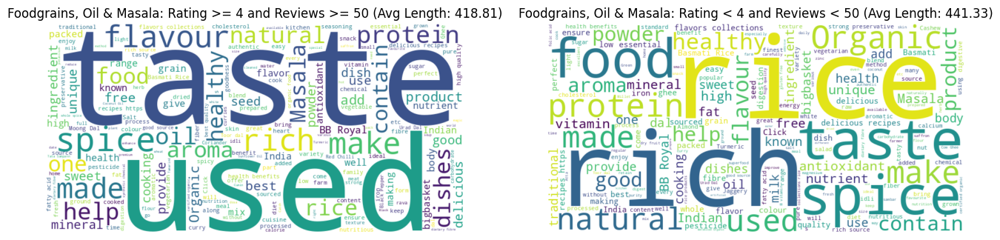

...

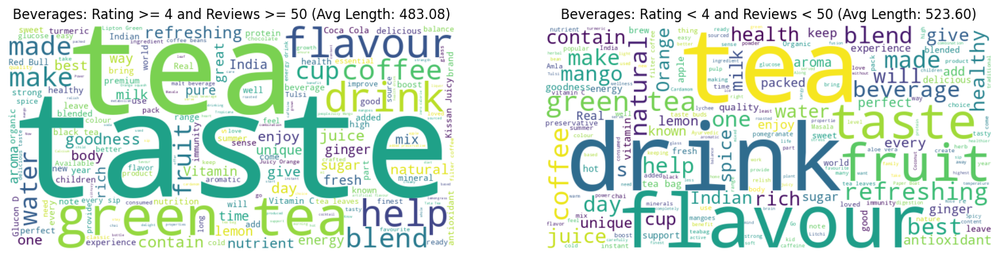

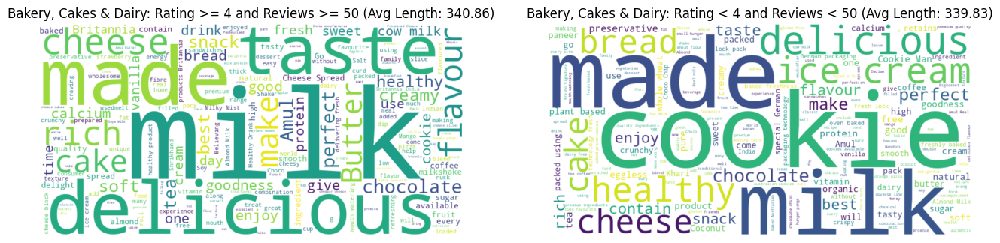

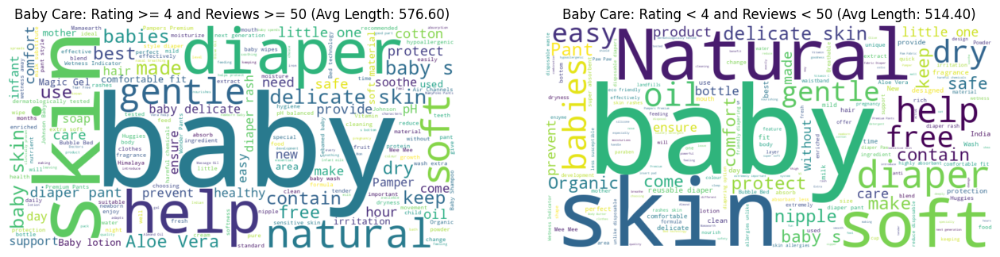

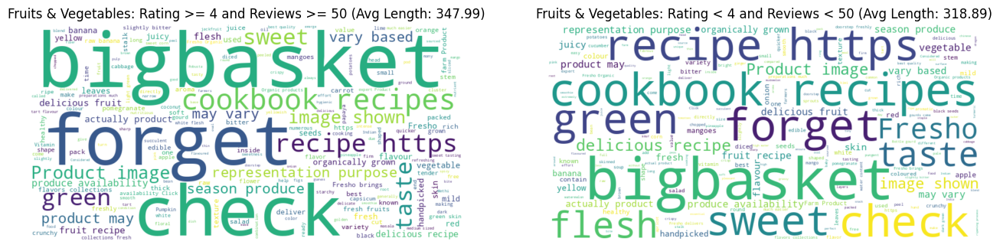

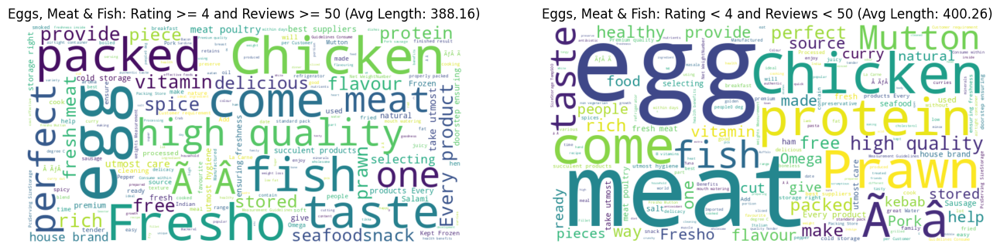

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import numpy as np

# Define categories
categories = ['Beauty & Hygiene', 'Kitchen, Garden & Pets', 'Cleaning & Household',
              'Gourmet & World Food', 'Foodgrains, Oil & Masala', 'Snacks & Branded Foods',
              'Beverages', 'Bakery, Cakes & Dairy', 'Baby Care', 'Fruits & Vegetables',
              'Eggs, Meat & Fish']

# Iterate over each category
for category in categories:
    # Filter data for rating >= 4 and reviews >= 50
    rating_gt4_reviews_gt50 = df[(df['category'] == category) & (df['product_rating'] >= 4) & (df['customer_reviews_count'] >= 50)]
    product_descriptions_gt4_gt50 = ' '.join(rating_gt4_reviews_gt50['product_description'].tolist())
    wordcloud_gt4_gt50 = WordCloud(width=800, height=400, background_color='white').generate(product_descriptions_gt4_gt50)

    # Filter data for rating < 4 and reviews < 50
    rating_lt4_reviews_lt50 = df[(df['category'] == category) & (df['product_rating'] < 4) & (df['customer_reviews_count'] < 50)]
    product_descriptions_lt4_lt50 = ' '.join(rating_lt4_reviews_lt50['product_description'].tolist())
    wordcloud_lt4_lt50 = WordCloud(width=800, height=400, background_color='white').generate(product_descriptions_lt4_lt50)

    # Calculate average length of product description
    average_length_gt4_gt50 = np.mean([len(description) for description in rating_gt4_reviews_gt50['product_description']])
    average_length_lt4_lt50 = np.mean([len(description) for description in rating_lt4_reviews_lt50['product_description']])

    # Create a figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

    # Plot the word clouds
    ax1.imshow(wordcloud_gt4_gt50, interpolation='bilinear')
    ax1.set_title(f'{category}: Rating >= 4 and Reviews >= 50 (Avg Length: {average_length_gt4_gt50:.2f})')
    ax1.axis('off')

    ax2.imshow(wordcloud_lt4_lt50, interpolation='bilinear')
    ax2.set_title(f'{category}: Rating < 4 and Reviews < 50 (Avg Length: {average_length_lt4_lt50:.2f})')
    ax2.axis('off')

    # Show the plot
    plt.show()


### wordclouds with product_title

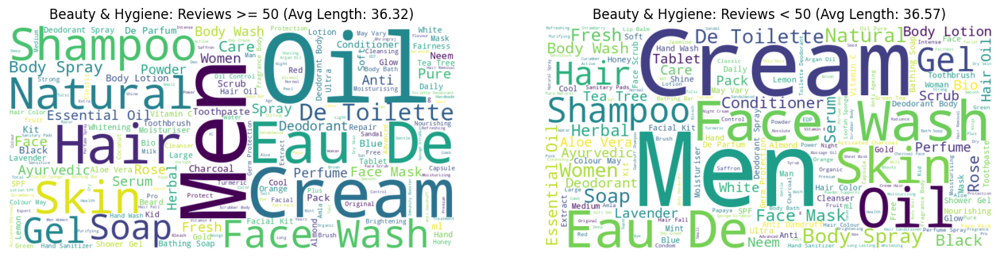

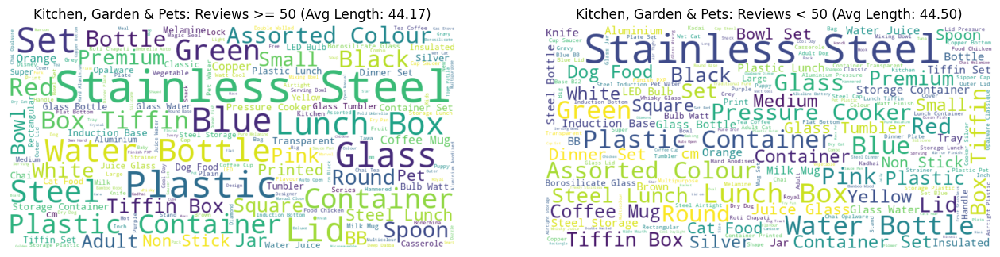

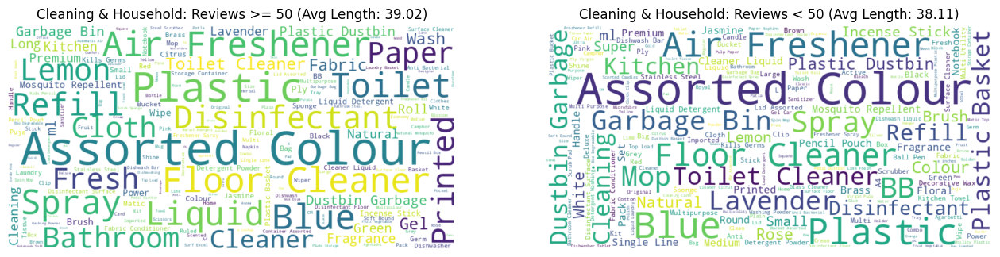

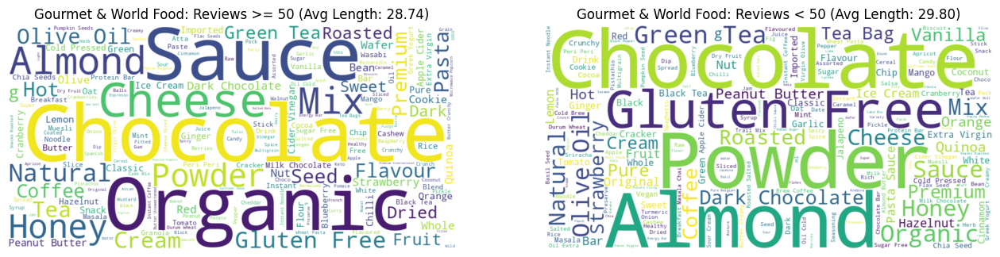

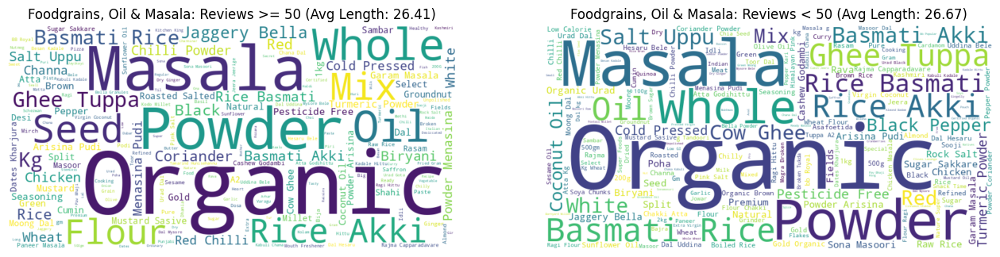

...

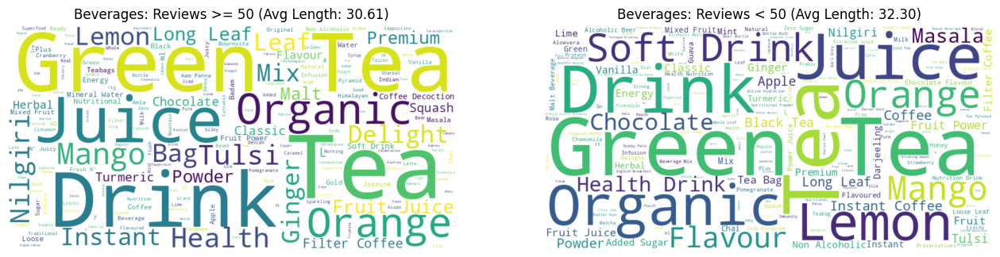

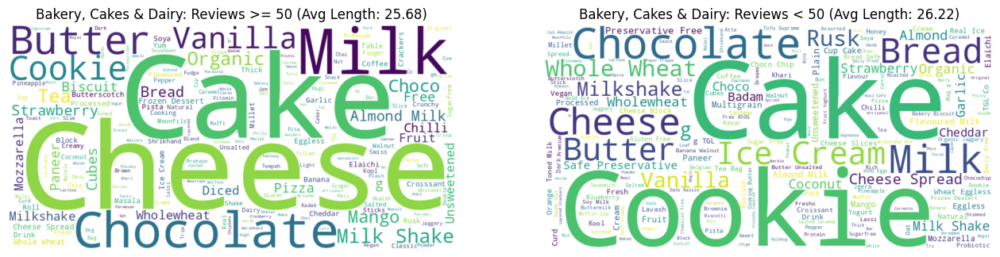

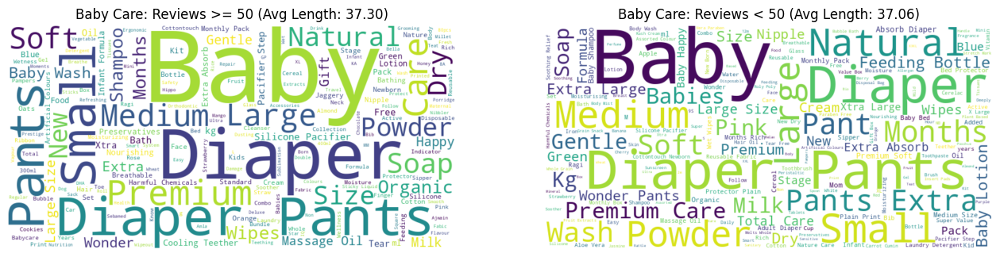

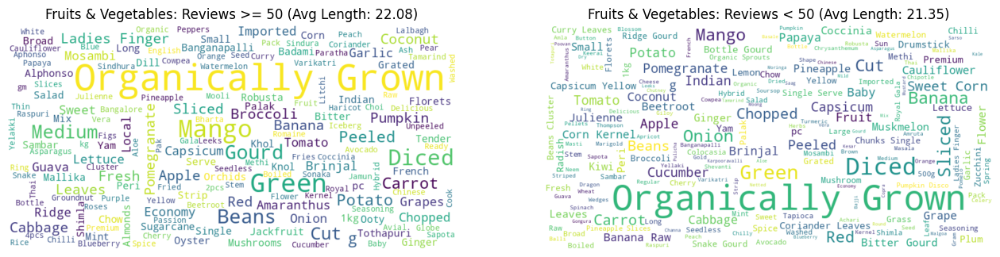

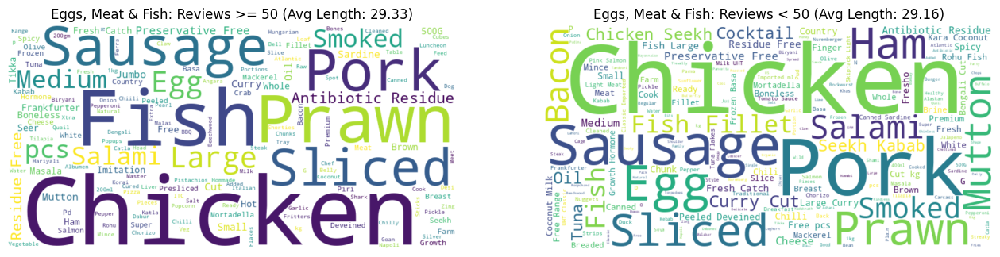

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import numpy as np

# Define categories
categories = ['Beauty & Hygiene', 'Kitchen, Garden & Pets', 'Cleaning & Household',
              'Gourmet & World Food', 'Foodgrains, Oil & Masala', 'Snacks & Branded Foods',
              'Beverages', 'Bakery, Cakes & Dairy', 'Baby Care', 'Fruits & Vegetables',
              'Eggs, Meat & Fish']

# Iterate over each category
for category in categories:
    # Filter data for rating >= 4 and reviews >= 50
    rating_gt4_reviews_gt50 = df[(df['category'] == category) &  (df['customer_reviews_count'] >= 75)]
    product_titles_gt4_gt50 = ' '.join(rating_gt4_reviews_gt50['product_title'].tolist())
    wordcloud_gt4_gt50 = WordCloud(width=800, height=400, background_color='white').generate(product_titles_gt4_gt50)

    # Filter data for rating < 4 and reviews < 50
    rating_lt4_reviews_lt50 = df[(df['category'] == category) &  (df['customer_reviews_count'] < 75)]
    product_titles_lt4_lt50 = ' '.join(rating_lt4_reviews_lt50['product_title'].tolist())
    wordcloud_lt4_lt50 = WordCloud(width=800, height=400, background_color='white').generate(product_titles_lt4_lt50)

    # Calculate average length of product title
    average_length_gt4_gt50 = np.mean([len(title) for title in rating_gt4_reviews_gt50['product_title']])
    average_length_lt4_lt50 = np.mean([len(title) for title in rating_lt4_reviews_lt50['product_title']])

    # Create a figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

    # Plot the word clouds
    ax1.imshow(wordcloud_gt4_gt50, interpolation='bilinear')
    ax1.set_title(f'{category}: Reviews >= 50 (Avg Length: {average_length_gt4_gt50:.2f})')
    ax1.axis('off')

    ax2.imshow(wordcloud_lt4_lt50, interpolation='bilinear')
    ax2.set_title(f'{category}: Reviews < 50 (Avg Length: {average_length_lt4_lt50:.2f})')
    ax2.axis('off')

    # Show the plot
    plt.show()


### Some plots to check high-demand products, and distribution of some numeric columns

In [ ]:
market_share = df['brand'].value_counts(normalize=True).head(10)
brand_loyalty = df.groupby('brand')['customer_reviews_count'].sum().sort_values(ascending=False)
growth_opportunities = df.groupby('category')['selling_price'].mean().sort_values(ascending=False).head(10)
high_demand = df['category'].value_counts().head(10)
price_data = df.groupby('product_id')['selling_price'].mean().sort_values(ascending=False)
rating_data = df.groupby('product_id')['product_rating'].mean().sort_values(ascending=False)
sales_data = df.groupby('product_id')['selling_price'].sum().sort_values(ascending=False)

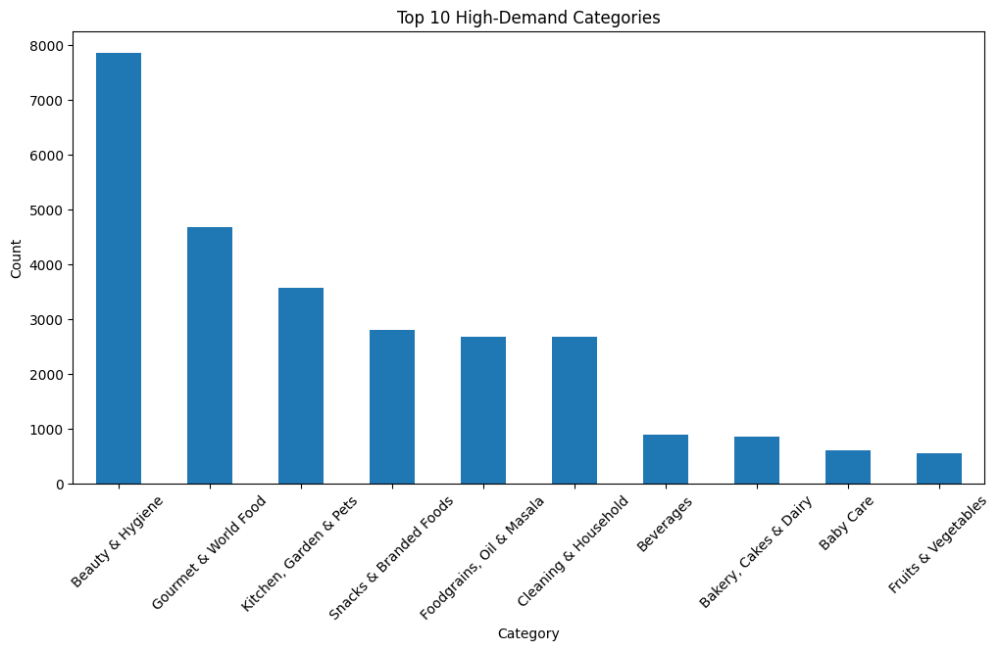

In [ ]:
plt.figure(figsize=(12, 6))
high_demand.plot(kind='bar')
plt.title('Top 10 High-Demand Categories')
plt.xlabel('Category')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

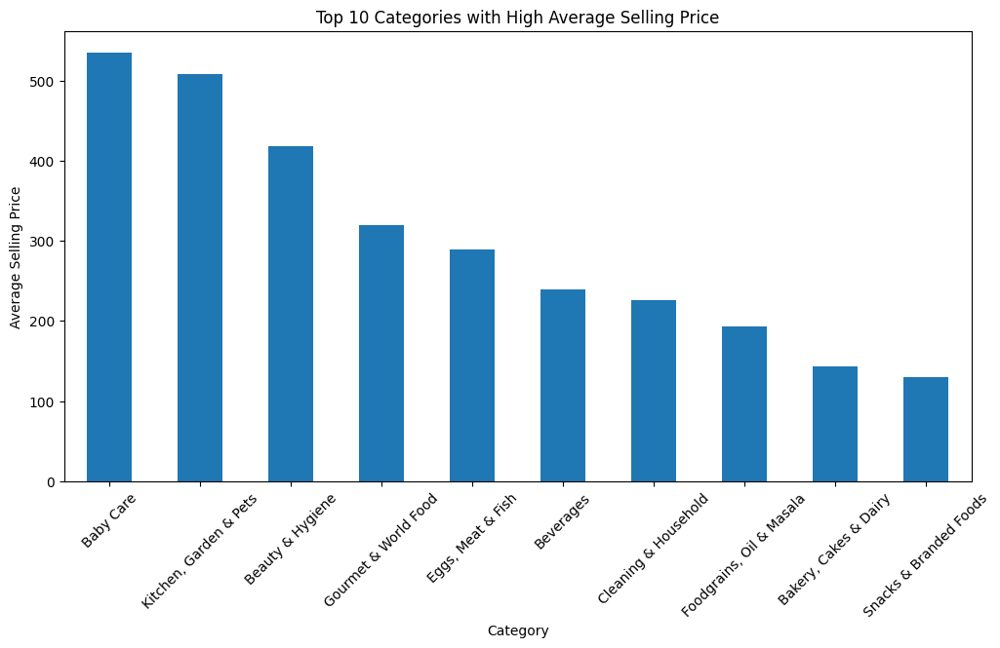

In [ ]:
plt.figure(figsize=(12, 6))
growth_opportunities.plot(kind='bar')
plt.title('Top 10 Categories with High Average Selling Price')
plt.xlabel('Category')
plt.ylabel('Average Selling Price')
plt.xticks(rotation=45)
plt.show()


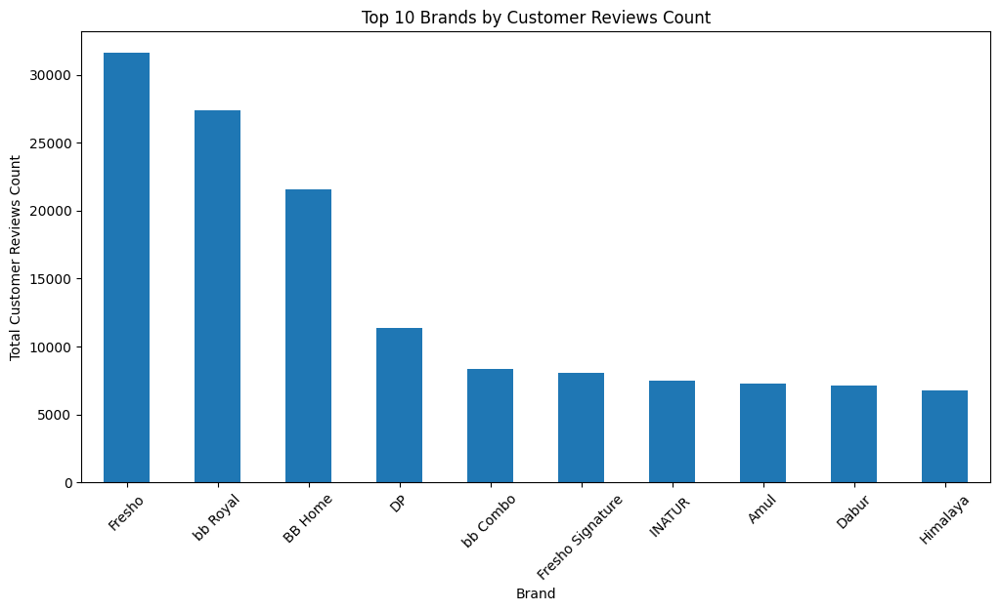

In [ ]:
plt.figure(figsize=(12, 6))
brand_loyalty.head(10).plot(kind='bar')
plt.title('Top 10 Brands by Customer Reviews Count')
plt.xlabel('Brand')
plt.ylabel('Total Customer Reviews Count')
plt.xticks(rotation=45)
plt.show()


Market Share of the brands

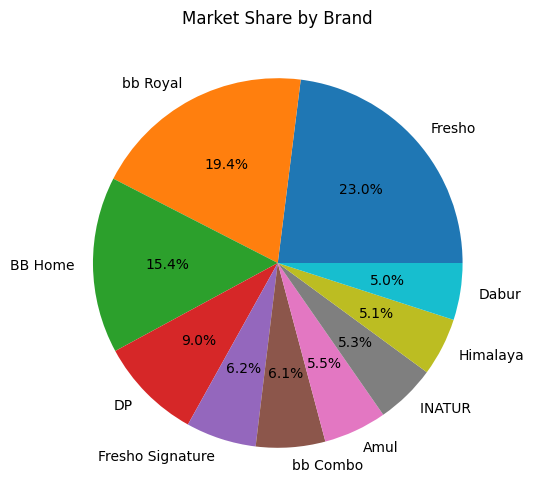

In [ ]:
plt.figure(figsize=(12, 6))
market_share.plot(kind='pie', autopct='%1.1f%%')
plt.title('Market Share by Brand')
plt.ylabel('')
plt.show()


Customer demographic

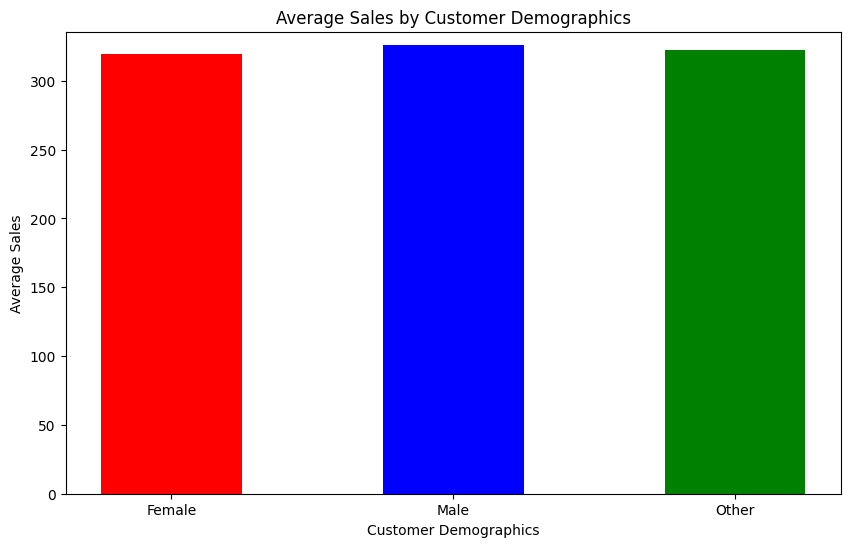

In [ ]:
# Group by customer_demographics and calculate the mean selling_price
grouped = df.groupby('customer_demographics')['selling_price'].mean().reset_index()

# Create the bar chart
plt.figure(figsize=(10, 6))
plt.bar(grouped['customer_demographics'], grouped['selling_price'], color=['red', 'blue', 'green', 'purple'],width=0.5)
plt.xlabel('Customer Demographics')
plt.ylabel('Average Sales')
plt.title('Average Sales by Customer Demographics')
plt.ylim(0, max(grouped['selling_price']) + 10)


# Display the plot
plt.show()

Promotion Indicator

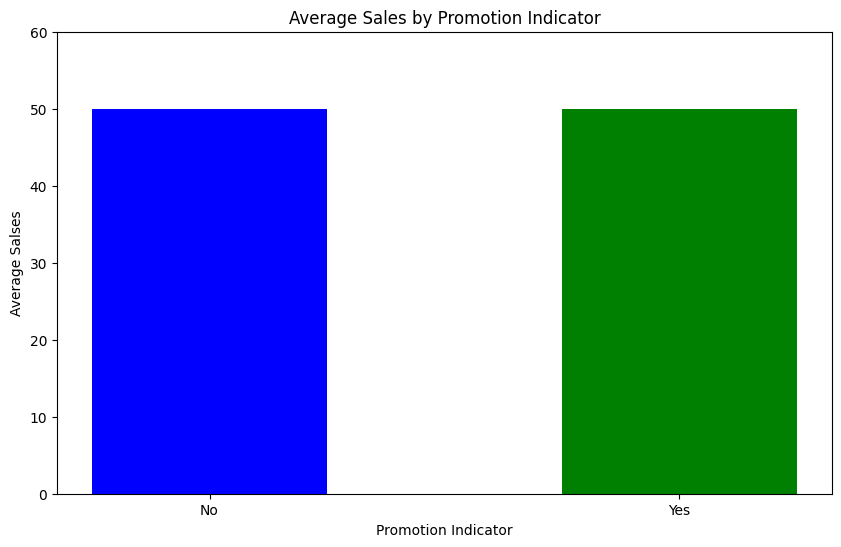

In [ ]:
grouped = df.groupby('promotion_indicator')['customer_reviews_count'].mean().reset_index()

# Create the bar chart
plt.figure(figsize=(10, 6))
plt.bar(grouped['promotion_indicator'], grouped['customer_reviews_count'], color=['blue', 'green'],width=0.5)
plt.xlabel('Promotion Indicator')
plt.ylabel('Average Salses')
plt.title('Average Sales by Promotion Indicator')
plt.ylim(0, max(grouped['customer_reviews_count']) + 10)


# Display the plot
plt.show()

### Trying Plotly for interactive charts

In [ ]:
avg_df = df[['category', 'product_rating', 'selling_price', 'original_price', 'customer_reviews_count']].groupby(['category']).mean().reset_index().sort_values('product_rating', ascending=False)
avg_df.head()

,category,product_rating,selling_price,original_price,customer_reviews_count
3,Beverages,4.062959,239.803925,272.270362,48.881222
6,"Foodgrains, Oil & Masala",4.036431,193.167500,230.131913,50.251868
0,Baby Care,4.013781,534.946180,596.754098,50.800000
7,Fruits & Vegetables,3.985714,50.889336,64.433662,50.242370
10,Snacks & Branded Foods,3.976618,129.593134,140.775231,49.886638


In [ ]:
avg_df['product_rating'] = avg_df['product_rating'].round(2)
px.scatter(avg_df, x='category', y='product_rating', color='product_rating', title='Average Rating per category', width=800)

# Some Machine Learning

In [ ]:
X=df[['category','product_subcategory','brand','selling_price','original_price','product_type','seasonal_indicator','promotion_indicator','customer_demographics']]
y_rating=df[['product_rating']]
y_sales=df[['customer_reviews_count']]

In [ ]:
# Categorical columns to one-hot encode
categorical_cols = ['category', 'product_subcategory', 'brand', 'product_type', 'seasonal_indicator', 'promotion_indicator', 'customer_demographics']

# Perform one-hot encoding
X_encoded = pd.get_dummies(X, columns=categorical_cols, drop_first=True)

# Display the encoded dataframe
X_encoded

,selling_price,original_price,"category_Bakery, Cakes & Dairy",category_Beauty & Hygiene,category_Beverages,category_Cleaning & Household,"category_Eggs, Meat & Fish","category_Foodgrains, Oil & Masala",category_Fruits & Vegetables,category_Gourmet & World Food,...,product_type_Whole Spices,product_type_Wine & Rice Vinegar,product_type_Women's Deodorants,product_type_Yogurt & Shrikhand,seasonal_indicator_Spring,seasonal_indicator_Summer,seasonal_indicator_Winter,promotion_indicator_Yes,customer_demographics_Male,customer_demographics_Other
0,220.00,220.0,False,True,False,False,False,False,False,False,...,False,False,False,False,True,False,False,True,False,False
1,180.00,180.0,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
2,119.00,250.0,False,False,False,True,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
3,149.00,176.0,False,False,False,True,False,False,False,False,...,False,False,False,False,True,False,False,False,False,True
4,162.00,162.0,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,True,True,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27550,199.20,249.0,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,True,False,True
27551,67.50,75.0,False,False,False,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
27552,200.00,200.0,False,False,False,False,False,False,False,True,...,False,False,False,False,False,False,False,True,False,False
27553,396.00,495.0,False,False,True,False,False,False,False,False,...,False,False,False,False,False,True,False,False,False,True


In [ ]:
ra=[]
for i in y_rating.values:
    if (i[0]<3.5):
        ra.append("Poor")
    elif(i[0]>3.5 and i[0]<4):
        ra.append("Decent")
    else:
        ra.append("Excellent")
y_rating=ra

In [ ]:
# Define the hyperparameters grid
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [ 10, 20, 30, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2]
}
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y_rating, test_size=0.2, random_state=42)
# Create a Decision Tree Classifier
clf = DecisionTreeClassifier(random_state=42)

# GridSearchCV
grid_search = GridSearchCV(clf, param_grid, cv=5, scoring='accuracy', verbose=1, n_jobs=-1)

# Fit the model
grid_search.fit(X_train, y_train)

# Best hyperparameters
best_params = grid_search.best_params_
print(f'Best hyperparameters: {best_params}')

# Predict on test set
y_pred = grid_search.predict(X_test)

# Evaluate model
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')

# Classification report
print(classification_report(y_test, y_pred))

Fitting 5 folds for each of 48 candidates, totalling 240 fits
Best hyperparameters: {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2}
Accuracy: 0.65
              precision    recall  f1-score   support

      Decent       0.42      0.03      0.06      1076
   Excellent       0.66      0.98      0.79      3570
        Poor       0.39      0.04      0.07       865

    accuracy                           0.65      5511
   macro avg       0.49      0.35      0.31      5511
weighted avg       0.57      0.65      0.53      5511

